# Fatiga

In [310]:
import numpy as np
import matplotlib.pyplot as plt
from tabulate import tabulate

### Resistencia a la fatiga

$$
S_e = k_a k_b k_c k_d k_e k_r S_e'
$$

Donde:
- $k_a$: Factor de superficie / Acabado superficial
- $k_b$: Factor de tamaño
- $k_c$: Factor de carga
- $k_d$: Factor de temperatura
- $k_e$: Factor de efectos diversos
- $k_r$: Factor de confiabilidad
- $S_e'$: Resistencia a la fatiga de probetas rotatorias

In [311]:
def calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima):
    return ka * kb * kc * kd * ke * kr * S_e_prima

**$k_a$ Factor de acabado superficial**

In [312]:
def calcular_ka(S_ut, acabado):
    if acabado == 'rectificado':
        a = 1.58
        b = -0.085
    elif acabado == 'maquinado':
        a = 4.51
        b = -0.265
    elif acabado == 'lam. caliente':
        a = 57.7
        b = -0.718
    elif acabado == 'forjado':
        a = 272
        b = -0.995

    return a * (S_ut ** b)

**$k_b$: Factor de tamaño**

In [313]:
def calcular_kb(d_nom):
    if d_nom <= 8:
        return 1
    elif 8 < d_nom <= 250:
        return 1.189 * (d_nom ** -0.097)
    else:
        return 0.6

**$k_c$: Factor de carga**

In [314]:
def calcular_kc(carga):
    if carga == 'flexion':
        return 1
    elif carga == 'axial':
        return 0.85
    elif carga == 'torsion':
        return 0.59

**$k_d$: Factor de temperatura**

In [315]:
k_d = 1

**$k_e$: Factor de efectos diversos**

In [316]:
k_e = 1

**$k_r$: Factor de confiabilidad**

In [317]:
k_r = 0.82 # Para una confiabilidad del 99%

**$S_e´$: Resistencia a la fatiga en probetas rotatorias**

In [318]:
def calcular_S_e_prima(S_ut, material):
    if material == 'acero':
        return min(700, 0.5 * S_ut)
    elif material == 'hierro fundido':
        return min(160, 0.4 * S_ut)
    elif material == 'aluminio':
        if S_ut < 330:
            return 0.4 * S_ut
        else:
            return 130
    elif material == 'cobre':
        if S_ut < 280:
            return 0.4 * S_ut
        else:
            return 100
    elif material == 'titanio':
        return 0.55 * S_ut

### Concentradores de tensión $K_t$

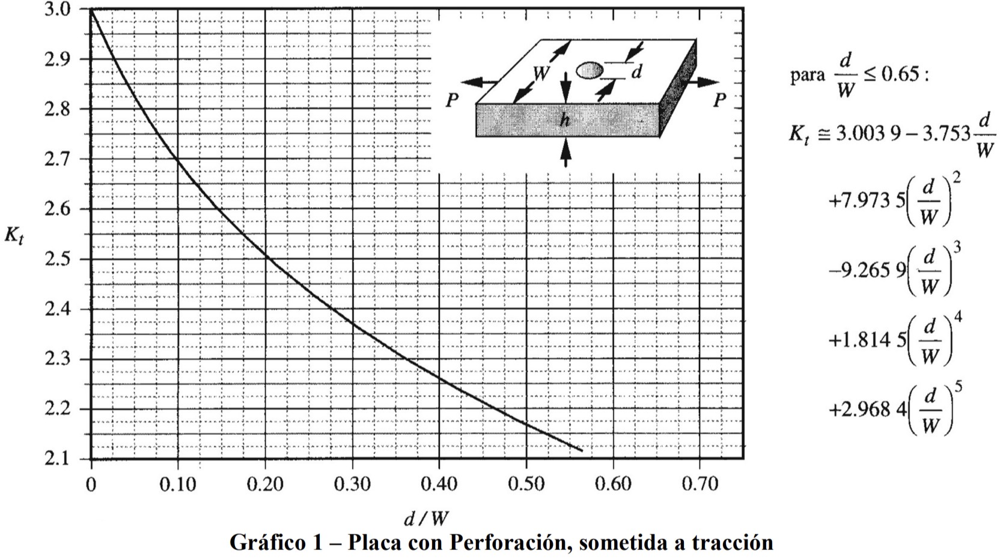 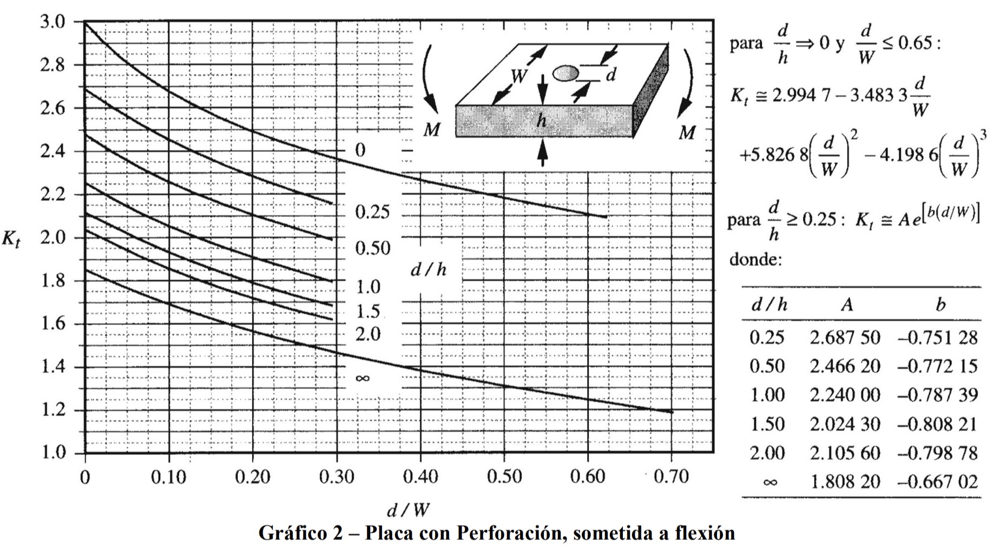 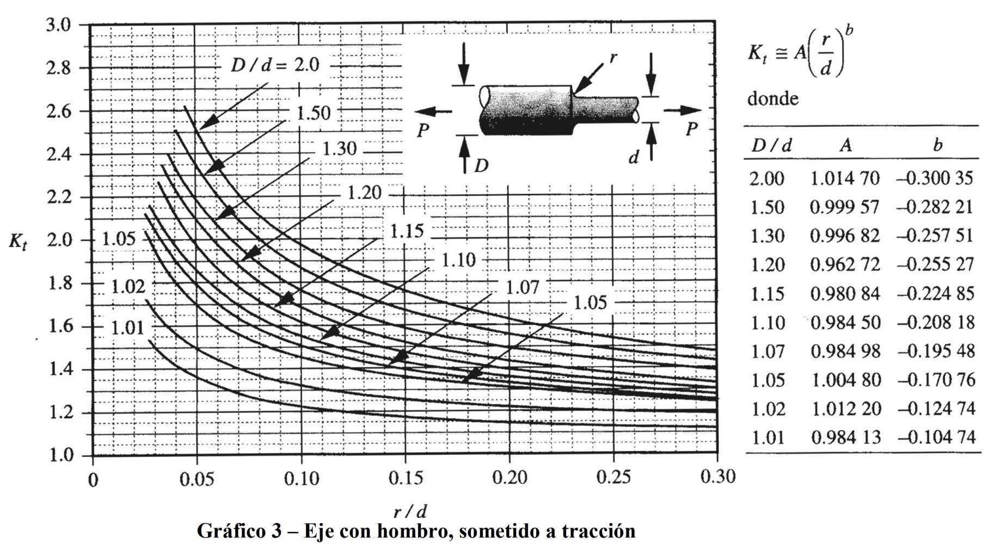 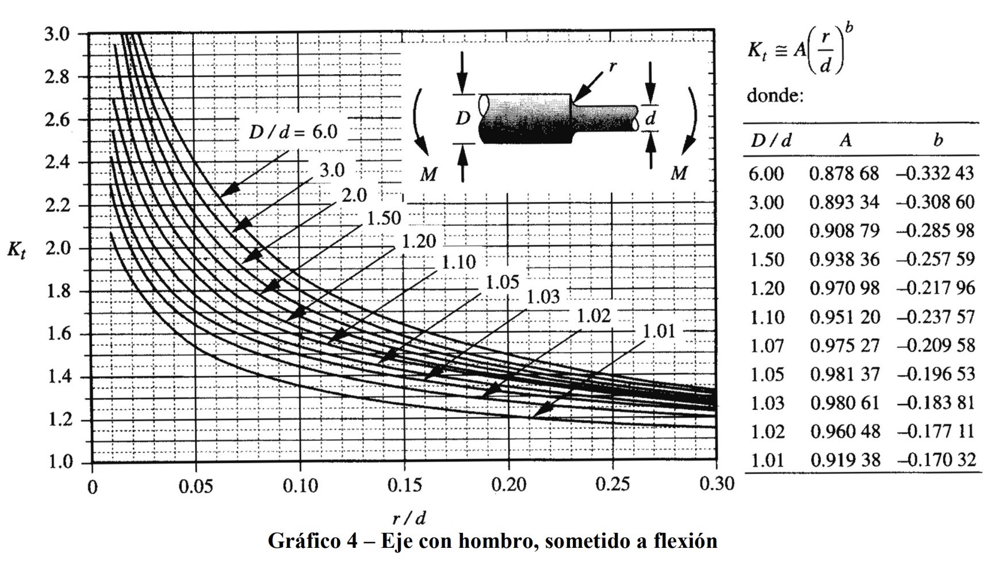 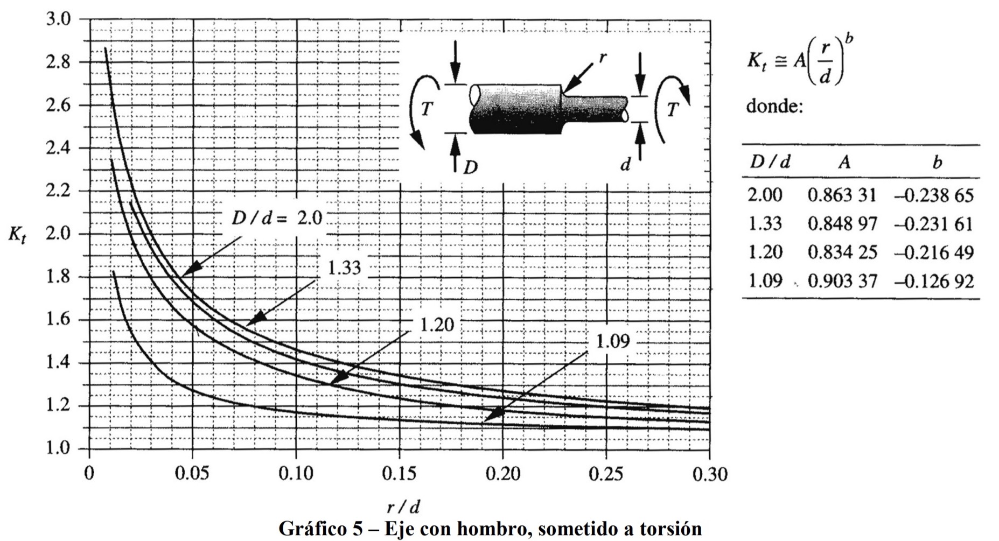 
...
 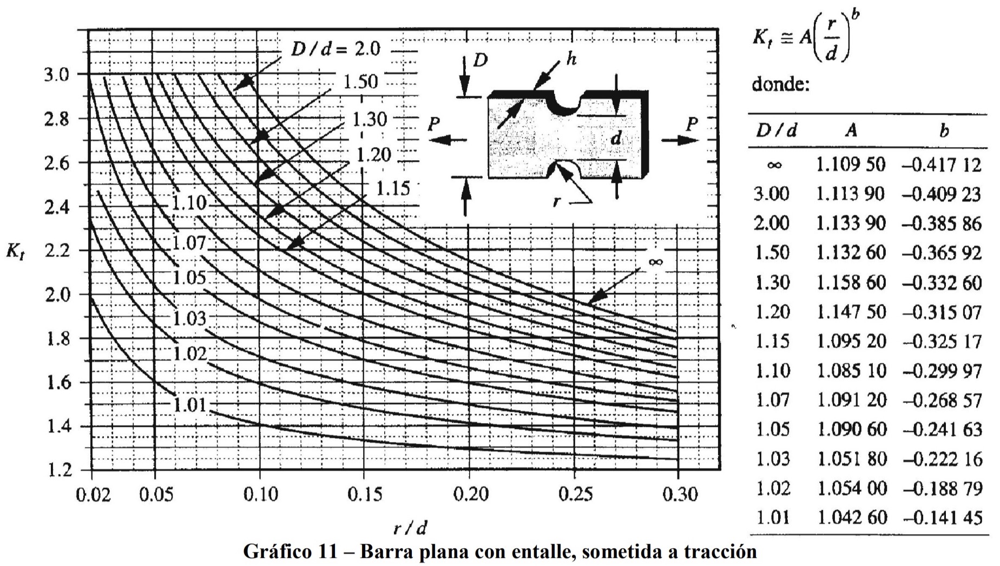 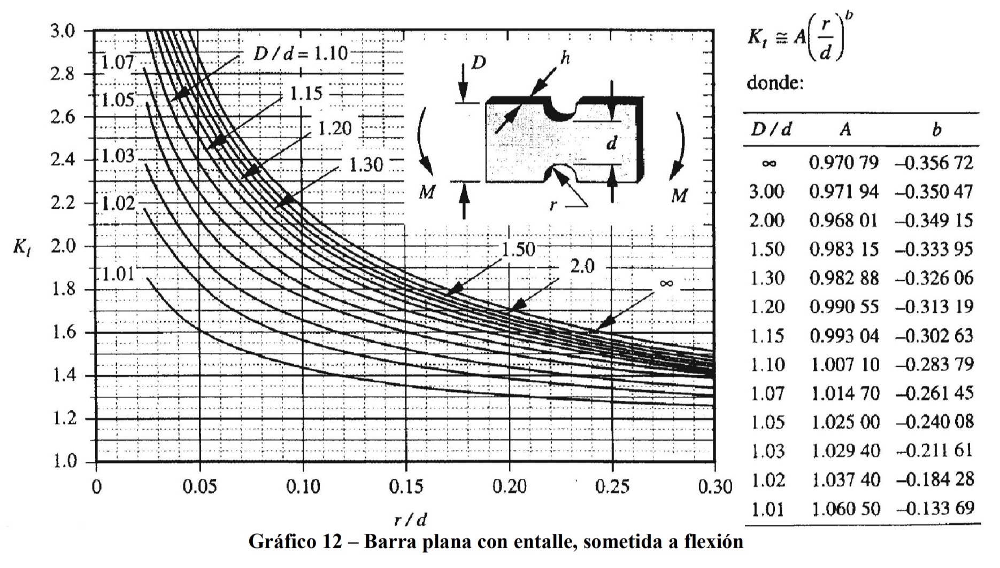 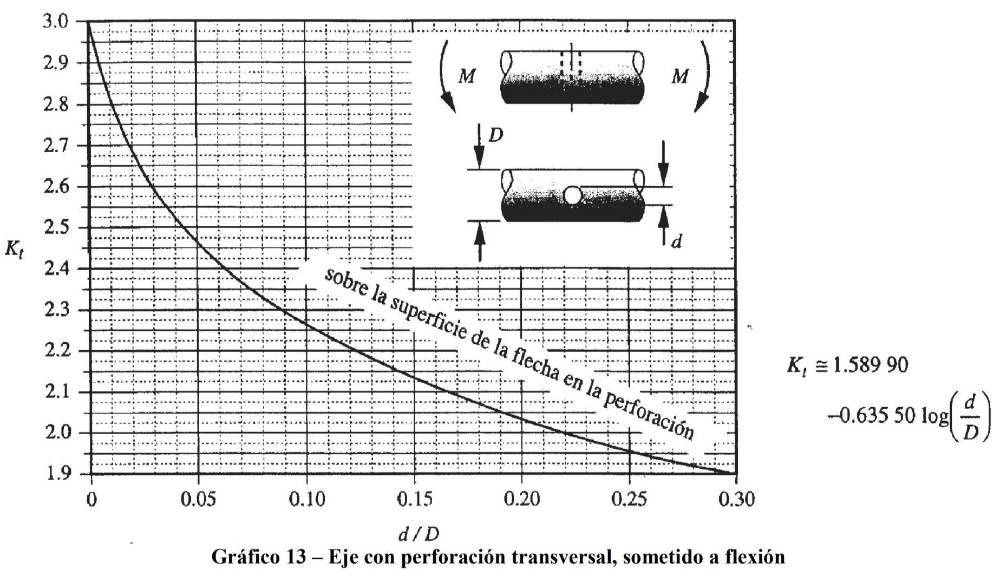 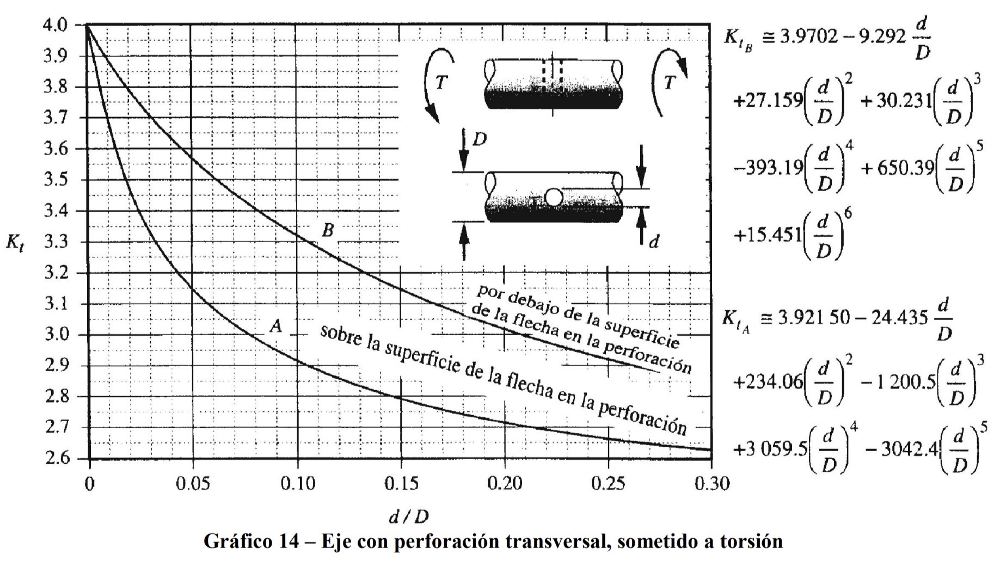 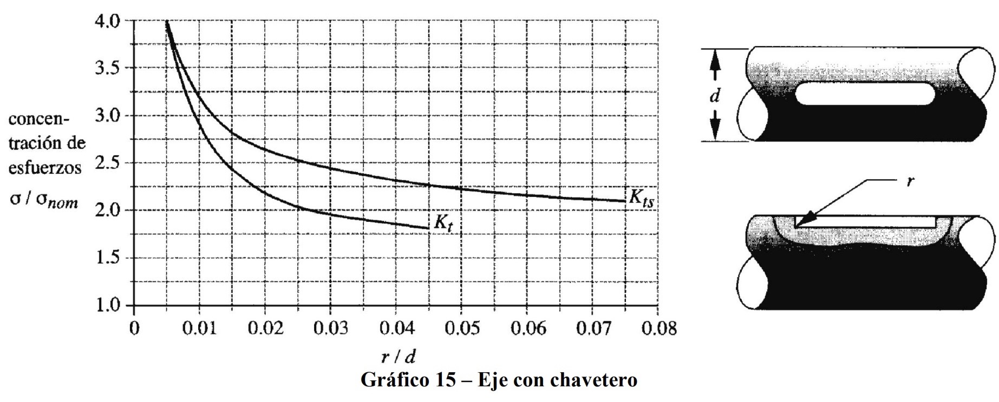 

In [319]:
import numpy as np
from scipy.interpolate import interp1d

def obtener_kt_chavetero(r, d, tipo='torsion'):
    """
    Calcula el factor de concentración de esfuerzos para un eje con chavetero
    basado en el 'Gráfico 15'.
    
    Parámetros:
    -----------
    r : float
        Radio del redondeo del chavetero (mismas unidades que d).
    d : float
        Diámetro del eje (mismas unidades que r).
    tipo : str
        'torsion' para obtener Kts (curva superior).
        'flexion' para obtener Kt (curva inferior).
        
    Retorna:
    --------
    float: El valor del factor de concentración (Kt o Kts).
    """
    
    ratio = r / d
    
    # Verificación de rango del gráfico (0.005 a 0.08 aprox)
    if ratio < 0.002 or ratio > 0.085:
        print(f"Advertencia: La relación r/d ({ratio:.4f}) está fuera del rango seguro del gráfico (0.005 - 0.08).")
        print("El resultado será una extrapolación y puede tener error.")

    # --- DATOS DIGITALIZADOS DEL GRÁFICO 15 ---
    # Puntos extraídos visualmente: [r/d, K]
    
    # Curva Superior: Kts (Torsión/Cortante)
    x_kts = [0.005, 0.010, 0.015, 0.020, 0.030, 0.040, 0.050, 0.060, 0.070, 0.080]
    y_kts = [4.00,  3.40,  3.05,  2.75,  2.45,  2.30,  2.20,  2.15,  2.12,  2.10]
    
    # Curva Inferior: Kt (Flexión/Normal)
    x_kt  = [0.005, 0.010, 0.015, 0.020, 0.030, 0.040, 0.050, 0.060, 0.070, 0.080]
    y_kt  = [3.80,  2.90,  2.45,  2.15,  1.95,  1.85,  1.78,  1.75,  1.72,  1.70]

    # --- INTERPOLACIÓN ---
    # Usamos interpolación cúbica para suavizar la curva entre puntos
    if tipo.lower() in ['torsion', 'torsión', 'kts']:
        interpolador = interp1d(x_kts, y_kts, kind='cubic', fill_value="extrapolate")
        k_val = interpolador(ratio)
        label = "Kts (Torsión)"
    elif tipo.lower() in ['flexion', 'flexión', 'bending', 'kt']:
        interpolador = interp1d(x_kt, y_kt, kind='cubic', fill_value="extrapolate")
        k_val = interpolador(ratio)
        label = "Kt (Flexión)"
    else:
        raise ValueError("El tipo debe ser 'torsion' o 'flexion'")
        
    return float(k_val)

# --- EJEMPLO DE USO ---
radio = 2.0   # mm
diametro = 50.0 # mm (r/d = 0.04)

kts = obtener_kt_chavetero(radio, diametro, tipo='torsion')
kt = obtener_kt_chavetero(radio, diametro, tipo='flexion')

print(f"Para r={radio} y d={diametro} (r/d = {radio/diametro}):")
print(f"Factor Kts (Torsión): {kts:.3f}") # Debería dar aprox 2.30 según el gráfico
print(f"Factor Kt (Flexión):  {kt:.3f}")  # Debería dar aprox 1.85 según el gráfico

Para r=2.0 y d=50.0 (r/d = 0.04):
Factor Kts (Torsión): 2.300
Factor Kt (Flexión):  1.850


### Concentradores de tensión en fatiga $K_f$ y factor de sensibilidad a las muescas $q$

$$
K_f = 1 + q(K_t - 1)
$$

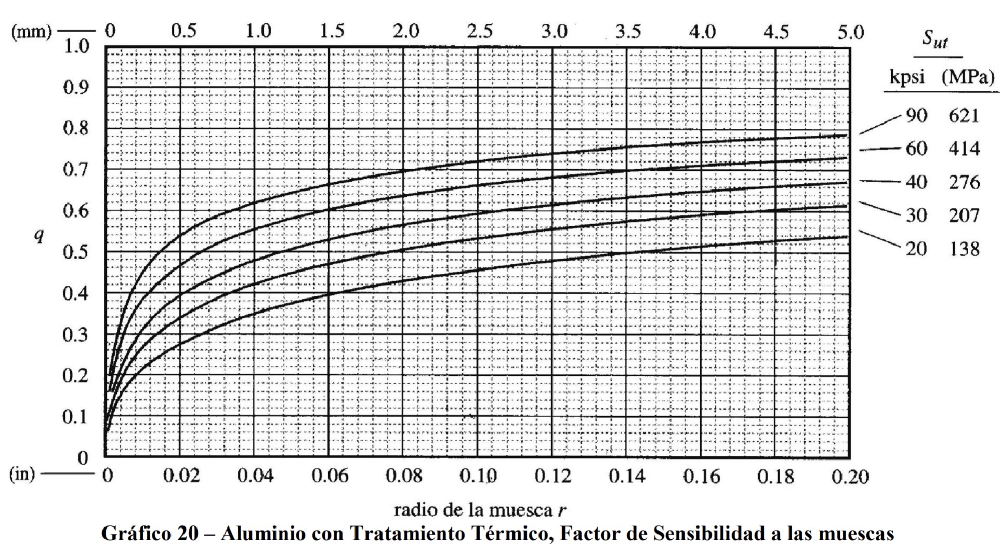 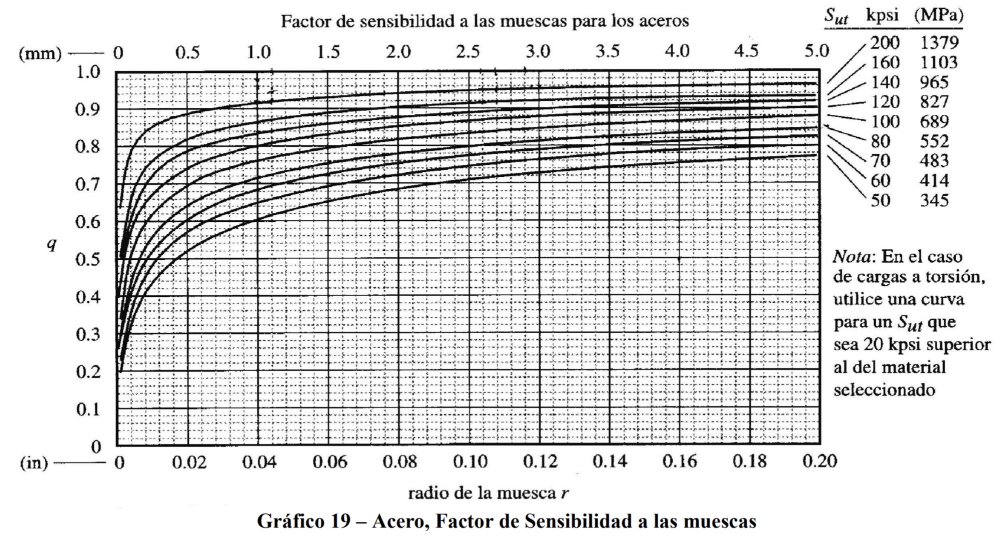


In [320]:
def calcular_K_f(q, K_t):
    return 1 + q * (K_t - 1)

### Tensión de Von Mises

$$
\sigma_{a,VM} = \sqrt{\sigma_a^2 + \tau_a^2}
$$

$$
\sigma_{m,VM} = \sqrt{\sigma_m^2 + \tau_m^2}
$$

In [321]:
def von_mises_stress(sigma, tau):
    """
    Calculate the von Mises stress given normal stress (sigma) and shear stress (tau).

    Parameters:
    sigma (float): Normal stress
    tau (float): Shear stress

    Returns:
    float: Von Mises stress
    """
    return np.sqrt(sigma**2 + 3 * tau**2)

### Criterio de Goodman

***Vida Infinita***

$$
\frac{\sigma_{a,VM}}{S_e} + \frac{\sigma_{m,VM}}{S_{ut}} = \frac{1}{n_f}
$$

***Vida Finita***

$$
\frac{\sigma_{a,VM}}{S_f} + \frac{\sigma_{m,VM}}{S_{ut}} = \frac{1}{n_f}
$$

$$
S_f = aN^b
$$

Donde $a = \frac{(0.9 S_{ut})^2}{S_e}$ y $b = -\frac{1}{3} \log \frac{0.9 S_{ut}}{S_e}$ en Aceros y $a = \frac{0.9 S_{ut}}{10^{3b}}$ y $b = -\frac{1}{5.7} \log \frac{0.9 S_{ut}}{S_e}$ para aleaciones de Aluminio, Titanio y Cobre

In [322]:
def criterio_goodman_vida_infinita(sigma_a, sigma_m, S_e, S_ut):
    """
    Calculate the safety factor using the Goodman criterion for infinite life.

    Parameters:
    sigma_a (float): Von Mises Alternating stress
    sigma_m (float): Von Mises Mean stress
    S_e (float): Endurance limit
    S_u (float): Ultimate tensile strength

    Returns:
    float: Safety factor
    """
    return 1 / ((sigma_a / S_e) + (sigma_m / S_ut))

def criterio_goodman_vida_finita(sigma_a, sigma_m, S_e, S_ut, n_f, material="Acero"):
    """
    Calculate the numbre of cycles to failure using the Goodman criterion for finite life.

    Parameters:
    sigma_a (float): Von Mises Alternating stress
    sigma_m (float): Von Mises Mean stress
    S_e (float): Endurance limit
    S_u (float): Ultimate tensile strength
    n_f (int): Safety factor

    Returns:
    float: N_f - Number of cycles to failure
    """
    
    S_f = sigma_a / (1/n_f - (sigma_m / S_ut))

    if material == "Acero":
        a = ((0.9 * S_ut)**2) / S_e
        b = - (1/3) * np.log10(0.9 * S_ut / (S_e))

    else:
        b = -(1/5.7) * np.log10(0.9 * S_ut / (S_e))
        a = (0.9 * S_ut) / (10 ** (b * 3))


    N_f = (S_f / a) ** (1 / b)

    return N_f

# Example usage
sigma_a_VM = 70.43
sigma_m_VM = 53.08
S_e = 91.8
S_ut = 310
n_f = 2
material = "Aluminio"
N_ciclos = criterio_goodman_vida_finita(sigma_a_VM, sigma_m_VM, S_e, S_ut, n_f, material)
print(f"Número de ciclos hasta la falla: {N_ciclos:.2f}")

Número de ciclos hasta la falla: 22635.67


### Regla de Miner

$$
D = \sum \frac{n_i}{N_i}
$$

# Cálculos para el proyecto

Se calcularán los diámetros necesarios para obtener **vida infinita** en cada uno de los ejes. Cada esfuerzo que aparece se aplica como una carga repetida entre $\sigma_a$ y $0$, de forma que la tensión media es no despreciable y tiene un valor de $\sigma_m = \sigma_a/2$. Se asume que las cargas de peso generadas por los engranes y catarinas son despreciables frente a los momentos torsores del sistema, por lo que sólo se evalúa el efecto de la torsión en cada uno de estos ejes

In [323]:
def calcular_esfuerzo_corte(M_t, d):
    return (16 * M_t) / (np.pi * d**3)

## Eje de los piñones

![Captura de pantalla 2025-11-29 a la(s) 13.40.14.png](<attachment:Captura de pantalla 2025-11-29 a la(s) 13.40.14.png>)
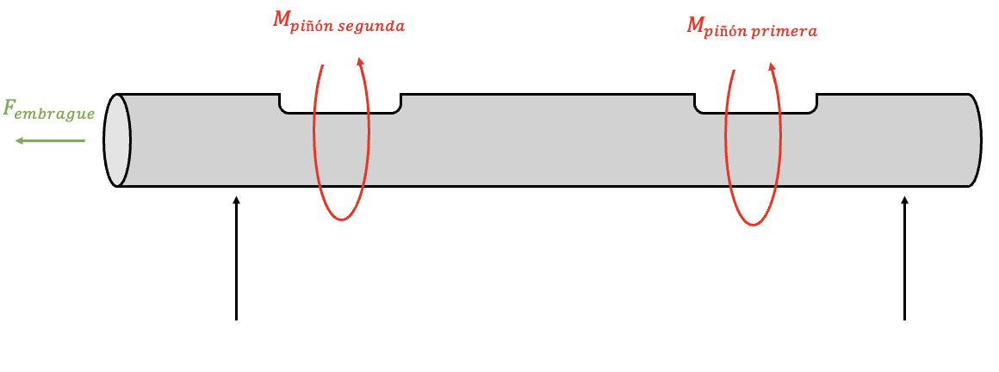

En este caso, los momentos en ambos piñones son iguales (el eje es el mismo, por lo que la velocidad angular y la potencia es la misma)

$$
M_t = 242.11 \;[Nm]
$$

Cálculo de la carga repetida $\sigma_{a,VM}$ y $\sigma_{m,VM}$ y gráfico de estas para $d = 45\;[mm]$ y $r = 3\;[mm]$

In [324]:
d = 40 # mm
r = 2 # mm
M_t = 242.11 * 1e3 # Nmm
S_ut = 792 # Acero 4340

# Calculamos el esfuerzo de corte
tau_nom = calcular_esfuerzo_corte(M_t, d)

K_t = obtener_kt_chavetero(r, d, tipo='torsion')

# Calculamos el concentrador de esfuerzos en fatiga
q = 0.78 # Calculado a partir del gráfico
K_f = calcular_K_f(q, K_t)

# Calculamos la tensión alternante y la tensión media en corte
tau_a = K_f * tau_nom
tau_m = tau_a / 2

# Calculamos el esfuerzo de Von Mises para amplitud y para la tensión media
sigma_a_VM = von_mises_stress(0, tau_a)
sigma_m_VM = von_mises_stress(0, tau_m)

# Calculamos la resistencia a la fatiga
S_e_prima = calcular_S_e_prima(S_ut, material="acero")
ka = calcular_ka(S_ut, acabado='rectificado')
kb = calcular_kb(d)
kc = calcular_kc('torsion')
kd = k_d
ke = k_e
kr = k_r
S_e = calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima)

# Comprobamos con el criterio de Goodman para vida infinita
n_f = criterio_goodman_vida_infinita(sigma_a_VM, sigma_m_VM, S_e, S_ut)

datos_resultados = [
    ["Esfuerzo cortante (tau_nom)", tau_nom, "MPa"],
    ["Factor de concentración (Kt)", K_t, "-"],
    ["Concentrador fatiga (Kf)", K_f, "-"],
    ["Tensión alternante corte (tau_a)", tau_a, "MPa"],
    ["Tensión media corte (tau_m)", tau_m, "MPa"],
    ["Von Mises alternante (sigma_a)", sigma_a_VM, "MPa"],
    ["Von Mises medio (sigma_m)", sigma_m_VM, "MPa"],
    ["Resistencia a la fatiga (Se)", S_e, "MPa"],
    ["Factor de Seguridad (nf)", n_f, "-"]
]

# 2. Imprimimos la tabla
# floatfmt=".2f" se encarga de redondear todos los números automáticamente.
print(tabulate(datos_resultados, 
               headers=["Parámetro", "Valor", "Unidad"], 
               tablefmt="fancy_grid", 
               floatfmt=".2f"))

# 3. Lógica de validación final (fuera de la tabla para dar énfasis)
if n_f < 1.5:
    print(f"\n❌❌❌ No hay vida infinita (nf = {n_f:.2f}) ❌❌❌")
else:
    print(f"\n✅ Diseño seguro para vida infinita (nf = {n_f:.2f})")

╒══════════════════════════════════╤═════════╤══════════╕
│ Parámetro                        │   Valor │ Unidad   │
╞══════════════════════════════════╪═════════╪══════════╡
│ Esfuerzo cortante (tau_nom)      │   19.27 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Factor de concentración (Kt)     │    2.20 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Concentrador fatiga (Kf)         │    1.94 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión alternante corte (tau_a) │   37.30 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión media corte (tau_m)      │   18.65 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises alternante (sigma_a)   │   64.61 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises medio (sigma_m)        │   32.30 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Resistencia 

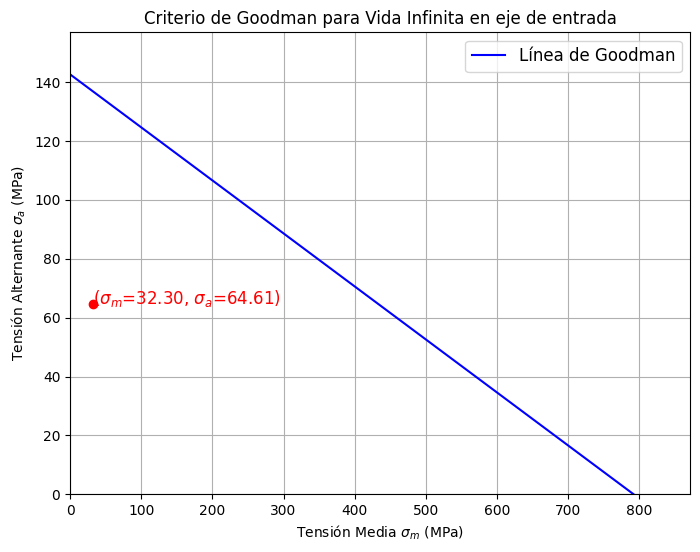

In [325]:
# Graficar la línea de Goodman y el punto evaluado
plt.figure(figsize=(8,6))
plt.title("Criterio de Goodman para Vida Infinita en eje de entrada")
plt.xlabel(r"Tensión Media $\sigma_m$ (MPa)")
plt.ylabel(r"Tensión Alternante $\sigma_a$ (MPa)")
# Línea de Goodman
sigma_m_vals = np.linspace(0, S_ut, 100)
sigma_a_vals = S_e * (1 - sigma_m_vals / S_ut)
plt.plot(sigma_m_vals, sigma_a_vals, label="Línea de Goodman", color='blue')
# Punto evaluado
plt.scatter(sigma_m_VM, sigma_a_VM, color='red', zorder=5)
plt.text(sigma_m_VM, sigma_a_VM, rf"($\sigma_m$={sigma_m_VM:.2f}, $\sigma_a$={sigma_a_VM:.2f})", color='red', fontsize=12)
# Configuraciones finales
plt.xlim(0, S_ut * 1.1)
plt.ylim(0, S_e * 1.1)
plt.grid(True)
plt.legend(fontsize=12)
plt.show()

## Eje de los engranes y la catarina impulsora

![Captura de pantalla 2025-11-29 a la(s) 13.40.04.png](<attachment:Captura de pantalla 2025-11-29 a la(s) 13.40.04.png>)
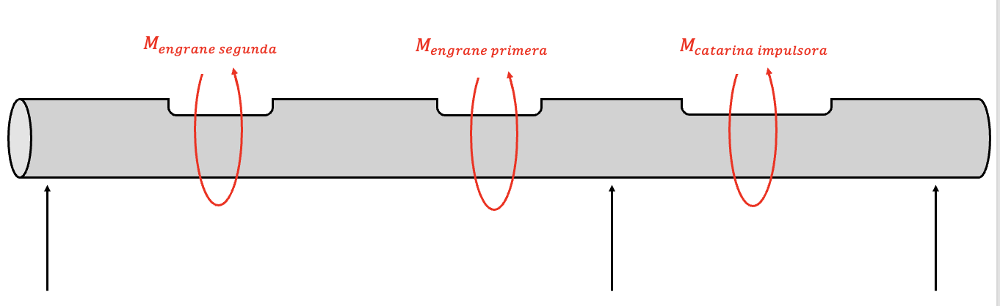

En este caso, el eje puede funcionar tanto en primera como en segunda. Como comparten el mismo eje los engranes con las catarinas, el momento de los engranes con el de la catarina será igual, por tanto, al evaluar la seguridad por los engranes, automáticamente se evalúa para la catarina

$$
M_{t,primera} = 605.28 \;[Nm]
$$

$$
M_{t,segunda} = 484.22 \;[Nm]
$$

Cálculo de la carga repetida $\sigma_{a,VM}$ y $\sigma_{m,VM}$ y gráfico de estas para $d = 50\;[mm]$ y $r = 3\;[mm]$. En particular, como en primera se tiene mayor torque, si se asegura la vida para la primera marcha, automáticamente se confirma para la segunda marcha

In [326]:
d = 50 # mm
r = 3 # mm
M_t = 605.28 * 1e3 # Nmm
S_ut = 792 # Acero 4340

# Calculamos el esfuerzo de corte
tau_nom = calcular_esfuerzo_corte(M_t, d)

K_t = obtener_kt_chavetero(r, d, tipo='torsion')

# Calculamos el concentrador de esfuerzos en fatiga
q = 0.8 # Calculado a partir del gráfico
K_f = calcular_K_f(q, K_t)

# Calculamos la tensión alternante y la tensión media en corte
tau_a = K_f * tau_nom
tau_m = tau_a / 2

# Calculamos el esfuerzo de Von Mises para amplitud y para la tensión media
sigma_a_VM = von_mises_stress(0, tau_a)
sigma_m_VM = von_mises_stress(0, tau_m)

# Calculamos la resistencia a la fatiga
S_e_prima = calcular_S_e_prima(S_ut, material="acero")
ka = calcular_ka(S_ut, acabado='rectificado')
kb = calcular_kb(d)
kc = calcular_kc('torsion')
kd = k_d
ke = k_e
kr = k_r
S_e = calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima)

# Comprobamos con el criterio de Goodman para vida infinita
n_f = criterio_goodman_vida_infinita(sigma_a_VM, sigma_m_VM, S_e, S_ut)

datos_resultados = [
    ["Esfuerzo cortante (tau_nom)", tau_nom, "MPa"],
    ["Factor de concentración (Kt)", K_t, "-"],
    ["Concentrador fatiga (Kf)", K_f, "-"],
    ["Tensión alternante corte (tau_a)", tau_a, "MPa"],
    ["Tensión media corte (tau_m)", tau_m, "MPa"],
    ["Von Mises alternante (sigma_a)", sigma_a_VM, "MPa"],
    ["Von Mises medio (sigma_m)", sigma_m_VM, "MPa"],
    ["Resistencia a la fatiga (Se)", S_e, "MPa"],
    ["Factor de Seguridad (nf)", n_f, "-"]
]

# 2. Imprimimos la tabla
# floatfmt=".2f" se encarga de redondear todos los números automáticamente.
print(tabulate(datos_resultados, 
               headers=["Parámetro", "Valor", "Unidad"], 
               tablefmt="fancy_grid", 
               floatfmt=".2f"))

# 3. Lógica de validación final (fuera de la tabla para dar énfasis)
if n_f < 1.5:
    print(f"\n❌❌❌ No hay vida infinita (nf = {n_f:.2f}) ❌❌❌")
else:
    print(f"\n✅ Diseño seguro para vida infinita (nf = {n_f:.2f})")

╒══════════════════════════════════╤═════════╤══════════╕
│ Parámetro                        │   Valor │ Unidad   │
╞══════════════════════════════════╪═════════╪══════════╡
│ Esfuerzo cortante (tau_nom)      │   24.66 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Factor de concentración (Kt)     │    2.15 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Concentrador fatiga (Kf)         │    1.92 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión alternante corte (tau_a) │   47.35 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión media corte (tau_m)      │   23.67 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises alternante (sigma_a)   │   82.01 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises medio (sigma_m)        │   41.01 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Resistencia 

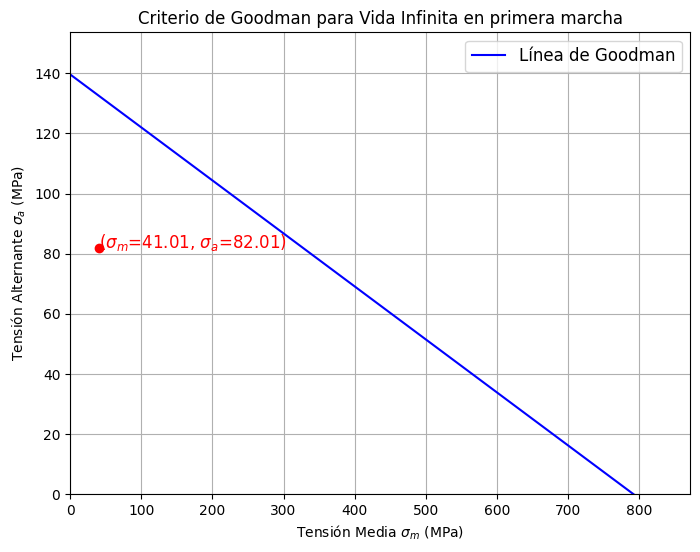

In [327]:
# Graficar la línea de Goodman y el punto evaluado
plt.figure(figsize=(8,6))
plt.title("Criterio de Goodman para Vida Infinita en primera marcha")
plt.xlabel(r"Tensión Media $\sigma_m$ (MPa)")
plt.ylabel(r"Tensión Alternante $\sigma_a$ (MPa)")
# Línea de Goodman
sigma_m_vals = np.linspace(0, S_ut, 100)
sigma_a_vals = S_e * (1 - sigma_m_vals / S_ut)
plt.plot(sigma_m_vals, sigma_a_vals, label="Línea de Goodman", color='blue')
# Punto evaluado
plt.scatter(sigma_m_VM, sigma_a_VM, color='red', zorder=5)
plt.text(sigma_m_VM, sigma_a_VM, rf"($\sigma_m$={sigma_m_VM:.2f}, $\sigma_a$={sigma_a_VM:.2f})", color='red', fontsize=12)
# Configuraciones finales
plt.xlim(0, S_ut * 1.1)
plt.ylim(0, S_e * 1.1)
plt.grid(True)
plt.legend(fontsize=12)
plt.show()

Ahora comprobamos cuando estamos en segunda

In [328]:
d = 50 # mm
r = 3 # mm
M_t = 484.22 * 1e3 # Nmm
S_ut = 792 # Acero 4340

# Calculamos el esfuerzo de corte
tau_nom = calcular_esfuerzo_corte(M_t, d)

K_t = obtener_kt_chavetero(r, d, tipo='torsion')

# Calculamos el concentrador de esfuerzos en fatiga
q = 0.8 # Calculado a partir del gráfico
K_f = calcular_K_f(q, K_t)

# Calculamos la tensión alternante y la tensión media en corte
tau_a = K_f * tau_nom
tau_m = tau_a / 2

# Calculamos el esfuerzo de Von Mises para amplitud y para la tensión media
sigma_a_VM = von_mises_stress(0, tau_a)
sigma_m_VM = von_mises_stress(0, tau_m)

# Calculamos la resistencia a la fatiga
S_e_prima = calcular_S_e_prima(S_ut, material="acero")
ka = calcular_ka(S_ut, acabado='rectificado')
kb = calcular_kb(d)
kc = calcular_kc('torsion')
kd = k_d
ke = k_e
kr = k_r
S_e = calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima)

# Comprobamos con el criterio de Goodman para vida infinita
n_f = criterio_goodman_vida_infinita(sigma_a_VM, sigma_m_VM, S_e, S_ut)

datos_resultados = [
    ["Esfuerzo cortante (tau_nom)", tau_nom, "MPa"],
    ["Factor de concentración (Kt)", K_t, "-"],
    ["Concentrador fatiga (Kf)", K_f, "-"],
    ["Tensión alternante corte (tau_a)", tau_a, "MPa"],
    ["Tensión media corte (tau_m)", tau_m, "MPa"],
    ["Von Mises alternante (sigma_a)", sigma_a_VM, "MPa"],
    ["Von Mises medio (sigma_m)", sigma_m_VM, "MPa"],
    ["Resistencia a la fatiga (Se)", S_e, "MPa"],
    ["Factor de Seguridad (nf)", n_f, "-"]
]

# 2. Imprimimos la tabla
# floatfmt=".2f" se encarga de redondear todos los números automáticamente.
print(tabulate(datos_resultados, 
               headers=["Parámetro", "Valor", "Unidad"], 
               tablefmt="fancy_grid", 
               floatfmt=".2f"))

# 3. Lógica de validación final (fuera de la tabla para dar énfasis)
if n_f < 1.5:
    print(f"\n❌❌❌ No hay vida infinita (nf = {n_f:.2f}) ❌❌❌")
else:
    print(f"\n✅ Diseño seguro para vida infinita (nf = {n_f:.2f})")

╒══════════════════════════════════╤═════════╤══════════╕
│ Parámetro                        │   Valor │ Unidad   │
╞══════════════════════════════════╪═════════╪══════════╡
│ Esfuerzo cortante (tau_nom)      │   19.73 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Factor de concentración (Kt)     │    2.15 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Concentrador fatiga (Kf)         │    1.92 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión alternante corte (tau_a) │   37.88 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión media corte (tau_m)      │   18.94 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises alternante (sigma_a)   │   65.61 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises medio (sigma_m)        │   32.80 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Resistencia 

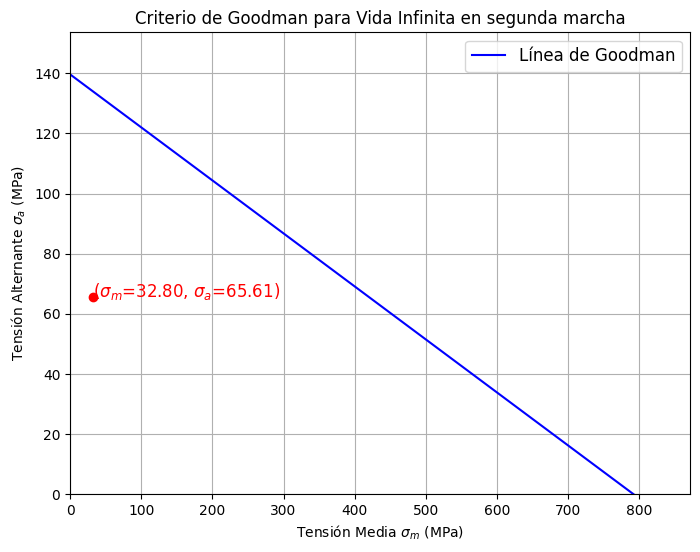

In [329]:
# Graficar la línea de Goodman y el punto evaluado
plt.figure(figsize=(8,6))
plt.title("Criterio de Goodman para Vida Infinita en segunda marcha")
plt.xlabel(r"Tensión Media $\sigma_m$ (MPa)")
plt.ylabel(r"Tensión Alternante $\sigma_a$ (MPa)")
# Línea de Goodman
sigma_m_vals = np.linspace(0, S_ut, 100)
sigma_a_vals = S_e * (1 - sigma_m_vals / S_ut)
plt.plot(sigma_m_vals, sigma_a_vals, label="Línea de Goodman", color='blue')
# Punto evaluado
plt.scatter(sigma_m_VM, sigma_a_VM, color='red', zorder=5)
plt.text(sigma_m_VM, sigma_a_VM, rf"($\sigma_m$={sigma_m_VM:.2f}, $\sigma_a$={sigma_a_VM:.2f})", color='red', fontsize=12)
# Configuraciones finales
plt.xlim(0, S_ut * 1.1)
plt.ylim(0, S_e * 1.1)
plt.grid(True)
plt.legend(fontsize=12)
plt.show()

## Eje de la catarina de salida

![Captura de pantalla 2025-11-29 a la(s) 13.39.54.png](<attachment:Captura de pantalla 2025-11-29 a la(s) 13.39.54.png>)
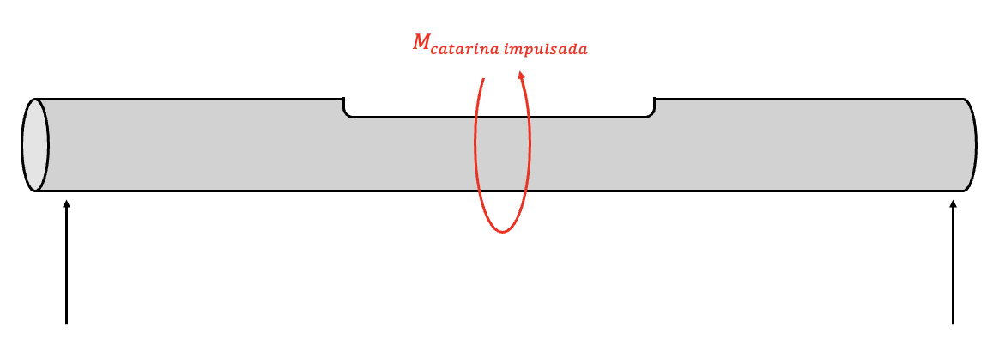

La primera marcha sigue siendo la crítica. Para cada marcha se tienen los siguientes valores de momento torsor:

$$
M_{t,primera} = 907.92 \;[Nm]
$$

$$
M_{t,segunda} = 726.33 \;[Nm]
$$

In [330]:
d = 60 # mm
r = 3 # mm
M_t = 907.92 * 1e3 # Nmm
S_ut = 792 # Acero 4340

# Calculamos el esfuerzo de corte
tau_nom = calcular_esfuerzo_corte(M_t, d)

K_t = obtener_kt_chavetero(r, d, tipo='torsion')

# Calculamos el concentrador de esfuerzos en fatiga
q = 0.78 # Calculado a partir del gráfico
K_f = calcular_K_f(q, K_t)

# Calculamos la tensión alternante y la tensión media en corte
tau_a = K_f * tau_nom
tau_m = tau_a / 2

# Calculamos el esfuerzo de Von Mises para amplitud y para la tensión media
sigma_a_VM = von_mises_stress(0, tau_a)
sigma_m_VM = von_mises_stress(0, tau_m)

# Calculamos la resistencia a la fatiga
S_e_prima = calcular_S_e_prima(S_ut, material="acero")
ka = calcular_ka(S_ut, acabado='rectificado')
kb = calcular_kb(d)
kc = calcular_kc('torsion')
kd = k_d
ke = k_e
kr = k_r
S_e = calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima)

# Comprobamos con el criterio de Goodman para vida infinita
n_f = criterio_goodman_vida_infinita(sigma_a_VM, sigma_m_VM, S_e, S_ut)

datos_resultados = [
    ["Esfuerzo cortante (tau_nom)", tau_nom, "MPa"],
    ["Factor de concentración (Kt)", K_t, "-"],
    ["Concentrador fatiga (Kf)", K_f, "-"],
    ["Tensión alternante corte (tau_a)", tau_a, "MPa"],
    ["Tensión media corte (tau_m)", tau_m, "MPa"],
    ["Von Mises alternante (sigma_a)", sigma_a_VM, "MPa"],
    ["Von Mises medio (sigma_m)", sigma_m_VM, "MPa"],
    ["Resistencia a la fatiga (Se)", S_e, "MPa"],
    ["Factor de Seguridad (nf)", n_f, "-"]
]

# 2. Imprimimos la tabla
# floatfmt=".2f" se encarga de redondear todos los números automáticamente.
print(tabulate(datos_resultados, 
               headers=["Parámetro", "Valor", "Unidad"], 
               tablefmt="fancy_grid", 
               floatfmt=".2f"))

# 3. Lógica de validación final (fuera de la tabla para dar énfasis)
if n_f < 1.5:
    print(f"\n❌❌❌ No hay vida infinita (nf = {n_f:.2f}) ❌❌❌")
else:
    print(f"\n✅ Diseño seguro para vida infinita (nf = {n_f:.2f})")

╒══════════════════════════════════╤═════════╤══════════╕
│ Parámetro                        │   Valor │ Unidad   │
╞══════════════════════════════════╪═════════╪══════════╡
│ Esfuerzo cortante (tau_nom)      │   21.41 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Factor de concentración (Kt)     │    2.20 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Concentrador fatiga (Kf)         │    1.94 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión alternante corte (tau_a) │   41.44 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión media corte (tau_m)      │   20.72 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises alternante (sigma_a)   │   71.78 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises medio (sigma_m)        │   35.89 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Resistencia 

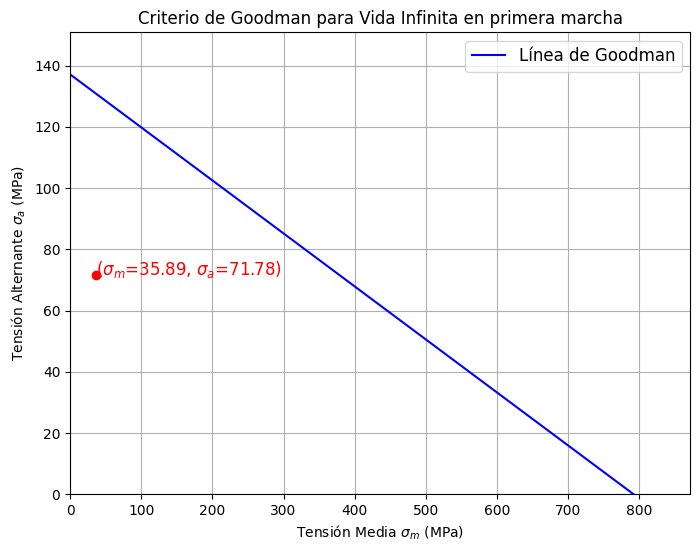

In [331]:
# Graficar la línea de Goodman y el punto evaluado
plt.figure(figsize=(8,6))
plt.title("Criterio de Goodman para Vida Infinita en primera marcha")
plt.xlabel(r"Tensión Media $\sigma_m$ (MPa)")
plt.ylabel(r"Tensión Alternante $\sigma_a$ (MPa)")
# Línea de Goodman
sigma_m_vals = np.linspace(0, S_ut, 100)
sigma_a_vals = S_e * (1 - sigma_m_vals / S_ut)
plt.plot(sigma_m_vals, sigma_a_vals, label="Línea de Goodman", color='blue')
# Punto evaluado
plt.scatter(sigma_m_VM, sigma_a_VM, color='red', zorder=5)
plt.text(sigma_m_VM, sigma_a_VM, rf"($\sigma_m$={sigma_m_VM:.2f}, $\sigma_a$={sigma_a_VM:.2f})", color='red', fontsize=12)
# Configuraciones finales
plt.xlim(0, S_ut * 1.1)
plt.ylim(0, S_e * 1.1)
plt.grid(True)
plt.legend(fontsize=12)
plt.show()

Ahora calculamos para la segunda marcha

In [332]:
d = 60 # mm
r = 3 # mm
M_t = 736.33 * 1e3 # Nmm
S_ut = 792 # Acero 4340

# Calculamos el esfuerzo de corte
tau_nom = calcular_esfuerzo_corte(M_t, d)

K_t = obtener_kt_chavetero(r, d, tipo='torsion')

# Calculamos el concentrador de esfuerzos en fatiga
q = 0.78 # Calculado a partir del gráfico
K_f = calcular_K_f(q, K_t)

# Calculamos la tensión alternante y la tensión media en corte
tau_a = K_f * tau_nom
tau_m = tau_a / 2

# Calculamos el esfuerzo de Von Mises para amplitud y para la tensión media
sigma_a_VM = von_mises_stress(0, tau_a)
sigma_m_VM = von_mises_stress(0, tau_m)

# Calculamos la resistencia a la fatiga
S_e_prima = calcular_S_e_prima(S_ut, material="acero")
ka = calcular_ka(S_ut, acabado='rectificado')
kb = calcular_kb(d)
kc = calcular_kc('torsion')
kd = k_d
ke = k_e
kr = k_r
S_e = calcular_S_e(ka, kb, kc, kd, ke, kr, S_e_prima)

# Comprobamos con el criterio de Goodman para vida infinita
n_f = criterio_goodman_vida_infinita(sigma_a_VM, sigma_m_VM, S_e, S_ut)

datos_resultados = [
    ["Esfuerzo cortante (tau_nom)", tau_nom, "MPa"],
    ["Factor de concentración (Kt)", K_t, "-"],
    ["Concentrador fatiga (Kf)", K_f, "-"],
    ["Tensión alternante corte (tau_a)", tau_a, "MPa"],
    ["Tensión media corte (tau_m)", tau_m, "MPa"],
    ["Von Mises alternante (sigma_a)", sigma_a_VM, "MPa"],
    ["Von Mises medio (sigma_m)", sigma_m_VM, "MPa"],
    ["Resistencia a la fatiga (Se)", S_e, "MPa"],
    ["Factor de Seguridad (nf)", n_f, "-"]
]

# 2. Imprimimos la tabla
# floatfmt=".2f" se encarga de redondear todos los números automáticamente.
print(tabulate(datos_resultados, 
               headers=["Parámetro", "Valor", "Unidad"], 
               tablefmt="fancy_grid", 
               floatfmt=".2f"))

# 3. Lógica de validación final (fuera de la tabla para dar énfasis)
if n_f < 1.5:
    print(f"\n❌❌❌ No hay vida infinita (nf = {n_f:.2f}) ❌❌❌")
else:
    print(f"\n✅ Diseño seguro para vida infinita (nf = {n_f:.2f})")

╒══════════════════════════════════╤═════════╤══════════╕
│ Parámetro                        │   Valor │ Unidad   │
╞══════════════════════════════════╪═════════╪══════════╡
│ Esfuerzo cortante (tau_nom)      │   17.36 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Factor de concentración (Kt)     │    2.20 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Concentrador fatiga (Kf)         │    1.94 │ -        │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión alternante corte (tau_a) │   33.61 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Tensión media corte (tau_m)      │   16.81 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises alternante (sigma_a)   │   58.22 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Von Mises medio (sigma_m)        │   29.11 │ MPa      │
├──────────────────────────────────┼─────────┼──────────┤
│ Resistencia 

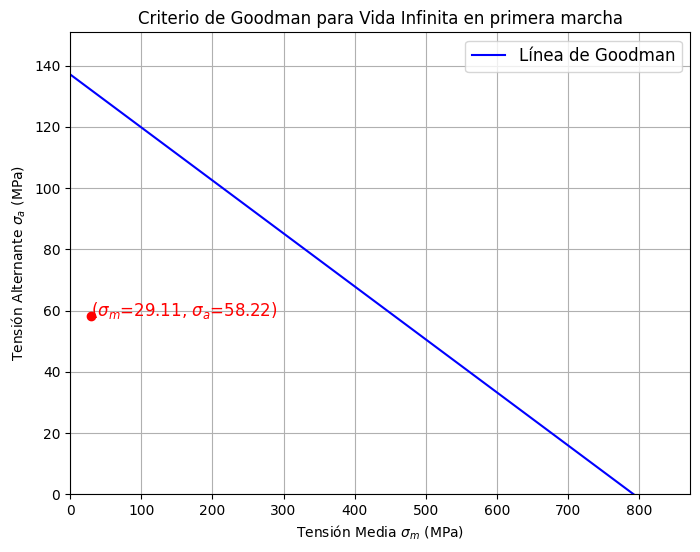

In [333]:
# Graficar la línea de Goodman y el punto evaluado
plt.figure(figsize=(8,6))
plt.title("Criterio de Goodman para Vida Infinita en primera marcha")
plt.xlabel(r"Tensión Media $\sigma_m$ (MPa)")
plt.ylabel(r"Tensión Alternante $\sigma_a$ (MPa)")
# Línea de Goodman
sigma_m_vals = np.linspace(0, S_ut, 100)
sigma_a_vals = S_e * (1 - sigma_m_vals / S_ut)
plt.plot(sigma_m_vals, sigma_a_vals, label="Línea de Goodman", color='blue')
# Punto evaluado
plt.scatter(sigma_m_VM, sigma_a_VM, color='red', zorder=5)
plt.text(sigma_m_VM, sigma_a_VM, rf"($\sigma_m$={sigma_m_VM:.2f}, $\sigma_a$={sigma_a_VM:.2f})", color='red', fontsize=12)
# Configuraciones finales
plt.xlim(0, S_ut * 1.1)
plt.ylim(0, S_e * 1.1)
plt.grid(True)
plt.legend(fontsize=12)
plt.show()